In [81]:
import os
print(os.getcwd())

C:\Users\garci\FinalReportPark


In [82]:
import numpy as np
import matplotlib.pyplot as plt
import utils2 as ppm
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score

In [83]:
dir(ppm)

['MASK_CACHE',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'add_lesion',
 'add_noise_k',
 'apply_mask_k',
 'find_spots',
 'forward_k',
 'generate_single_patch_pair',
 'get_lesion_kernel',
 'indices_shifted',
 'inverse_k',
 'kspace__mask2x',
 'kspace__mask4x',
 'load_kspace_masks',
 'mri_valid_regions',
 'np',
 'scipy']

In [84]:
MRI_imgs = np.load('./Data/MRI_imgs/HCP_selected_ones2.npy', mmap_mode = 'r')
MRI_seg = np.load('./Data/MRI_seg/HCP_selected_ones2_wmparc.npy', mmap_mode = 'r')

In [85]:
print(f'MRI images dataset shape: {MRI_imgs.shape}')
print(f'MRI segmentation dataset shape: {MRI_seg.shape}')

MRI images dataset shape: (11130, 260, 311)
MRI segmentation dataset shape: (11130, 260, 311)


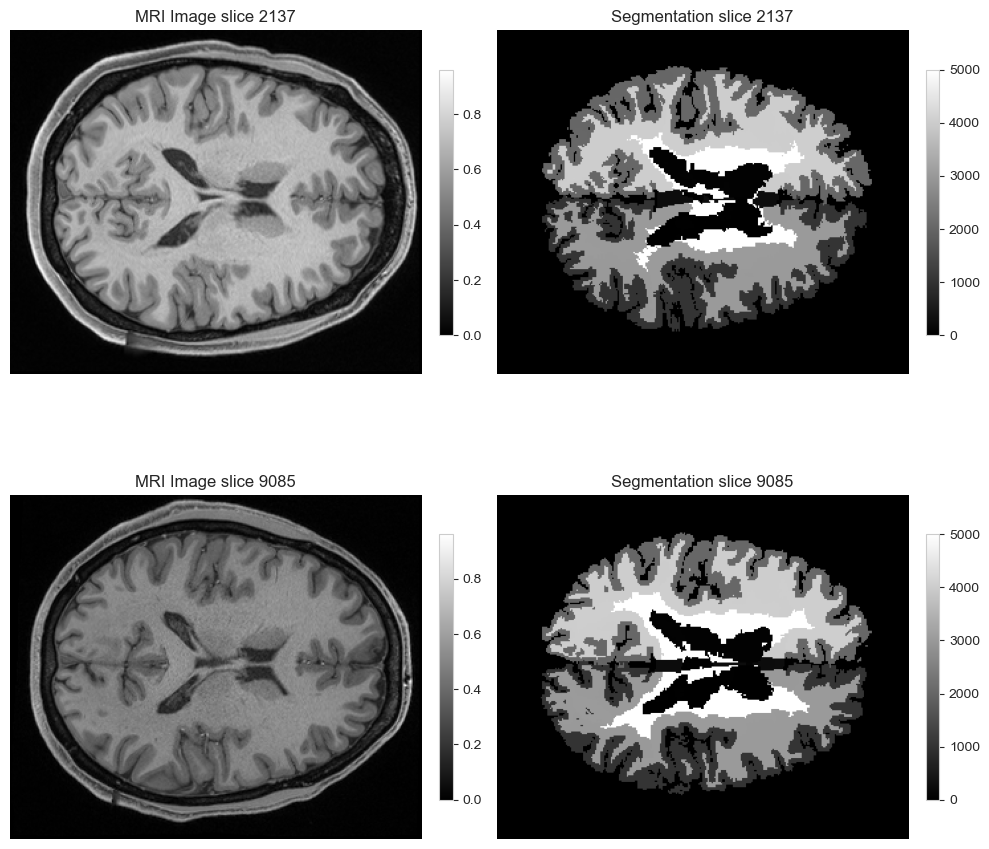

In [86]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Select 4 random, unique indices
idx_list = random.sample(range(len(MRI_imgs)), 2)

# Stack images to compute global vmin and vmax
selected_imgs = np.array([MRI_imgs[i] for i in idx_list])
vmin = np.min(selected_imgs)
vmax = np.max(selected_imgs)

plt.figure(figsize=(10, 10))
for i, idx in enumerate(idx_list):
    # MRI image
    plt.subplot(2, 2, 2 * i + 1)
    im1 = plt.imshow(MRI_imgs[idx], cmap='gray', vmin=vmin, vmax=vmax)
    plt.title(f"MRI Image slice {idx}")
    plt.axis('off')
    plt.colorbar(im1, fraction=0.03, pad=0.04)

    # Segmentation
    plt.subplot(2, 2, 2 * i + 2)
    im2 = plt.imshow(MRI_seg[idx], cmap='gray')
    plt.title(f"Segmentation slice {idx}")
    plt.axis('off')
    plt.colorbar(im2, fraction=0.03, pad=0.04)

plt.tight_layout()
plt.show()


In [87]:
demo_kernel = ppm.get_lesion_kernel(rot = 30, intensity = 1)
demo_kernel_1 = ppm.get_lesion_kernel(rot = 30, intensity = 0.2)

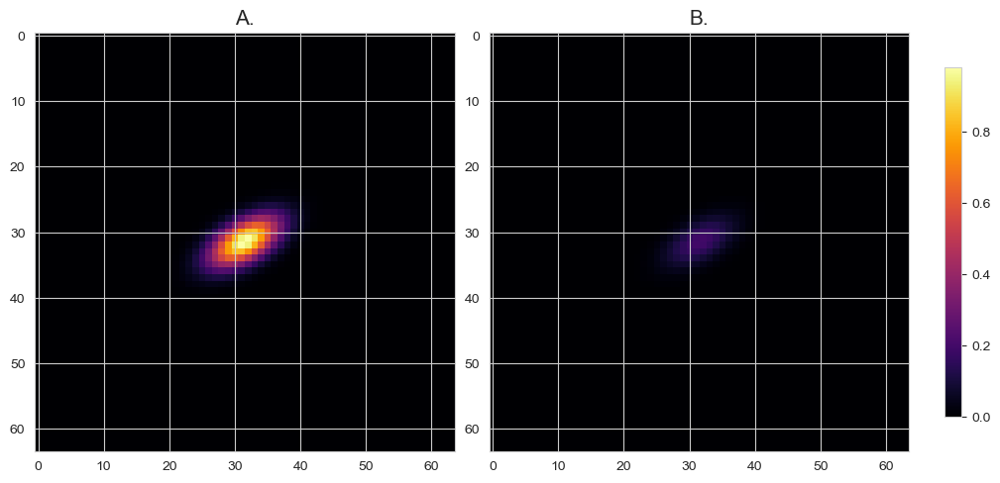

In [94]:
fig, axs = plt.subplots(1, 2, figsize=(10, 10), constrained_layout=True)

# Define common vmin and vmax
vmin = min(demo_kernel.min(), demo_kernel_1.min())
vmax = max(demo_kernel.max(), demo_kernel_1.max())

im1 = axs[0].imshow(demo_kernel, vmin=vmin, vmax=vmax, cmap='inferno')
#axs[0].axis('off')
axs[0].set_title("A.", fontsize = 15)
#axs[0].set_title("Demo inclination : 30 intensity : 1", fontsize = 20)

im2 = axs[1].imshow(demo_kernel_1, vmin=vmin, vmax=vmax, cmap='inferno')
axs[1].axis('on')
axs[1].set_title("B.", fontsize = 15)
#axs[1].set_title("Demo inclination : 30 intensity : 0.2", fontsize = 20)

# Add colorbar using the figure and both axes
fig.colorbar(im2, ax=axs, fraction=0.02, pad=0.04)

plt.show()


In [95]:
patch_size = 64
target_pairs = 11000

signal_patches = []
nonsignal_patches = []
lesion_centers = []
original_imgs = []
recon_arrays = []
orig_recons = []

for i in range(50):
    img = MRI_imgs[i, :, :].copy()
    seg = MRI_seg[i, :, :].copy()

    # 1. Get binary white matter mask
    valid_mask = ppm.mri_valid_regions(seg)

    # 2. Get lesion placement locations
    lesion_spots = ppm.find_spots(valid_mask, demo_kernel, unpad = 20)
    if len(lesion_spots) < 2:
        continue  # need at least one signal and one non-signal location

    lesion_loc = lesion_spots[0]  # [y, x], bottom-right of 64x64 region
    alt_loc = lesion_spots[1]

    # 3. Preserve clean copy of image (for non-signal case)
    original_img = img.copy()

    # 4. Add lesion to working image
    ppm.add_lesion(img, demo_kernel * 1, lesion_loc)

    # 5. Forward model + noise + mask + inverse on signal-present image
    img_k = ppm.forward_k(img)
    img_k.real = ppm.add_noise_k(img_k.real, 1e-5 * img_k.real.max())
    img_k.imag = ppm.add_noise_k(img_k.imag, 1e-5 * img_k.imag.max())
    img_k = ppm.apply_mask_k(img_k, 4)
    recon_array = ppm.inverse_k(img_k).real


    # 6. Extract signal-present patch
    y, x = lesion_loc
    signal_patch = recon_array[y-63:y+1, x-63:x+1]

    # 7. Forward model on original clean image (signal-absent version)
    orig_k = ppm.forward_k(original_img)
    orig_k.real = ppm.add_noise_k(orig_k.real, 1e-5 * orig_k.real.max())
    orig_k.imag = ppm.add_noise_k(orig_k.imag, 1e-5 * orig_k.imag.max())
    orig_k = ppm.apply_mask_k(orig_k, 4)
    orig_recon = ppm.inverse_k(orig_k).real

    # 8. Extract signal-absent patch
    y_ns, x_ns = alt_loc
    nonsignal_patch = orig_recon[y_ns-63:y_ns+1, x_ns-63:x_ns+1]

    # 9. Save results
    signal_patches.append(signal_patch)
    nonsignal_patches.append(nonsignal_patch)
    lesion_centers.append((i, x, y))
    original_imgs.append(original_img)
    recon_arrays.append(recon_array)
    orig_recons.append(orig_recon)

    if len(signal_patches) >= target_pairs:
        print("Reached 22,000 total patches (11,000 pairs).")
        break

# Final summary
print(f"Signal-present patches collected: {len(signal_patches)}")
print(f"Signal-absent  patches collected: {len(nonsignal_patches)}")
print(f"Total paired patches: {len(signal_patches) + len(nonsignal_patches)}")

Signal-present patches collected: 50
Signal-absent  patches collected: 50
Total paired patches: 100


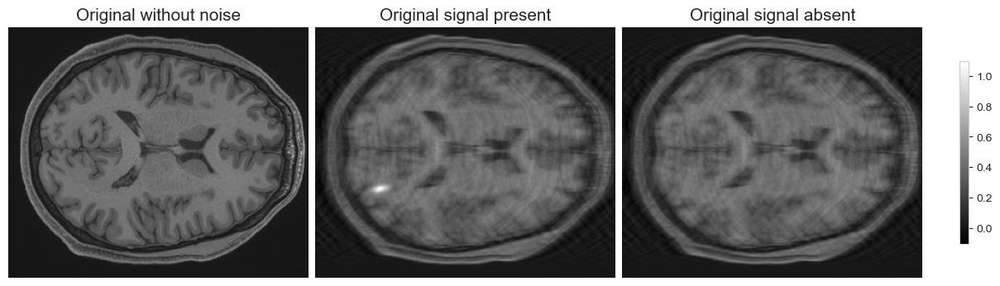

In [98]:
import matplotlib.pyplot as plt
import numpy as np

# Stack images to compute global vmin and vmax
all_imgs = np.array([original_imgs[22], recon_arrays[22], orig_recons[22]])
vmin = np.min(all_imgs)
vmax = np.max(all_imgs)

# Use constrained_layout to handle spacing automatically
fig, axes = plt.subplots(1, 3, figsize=(12, 5), constrained_layout=True)

titles = ['Original without noise', 'Original signal present', 'Original signal absent']
images = [original_imgs[22], recon_arrays[22], orig_recons[22]]

for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize = 15)
    ax.axis('off')

# Add a single shared colorbar
fig.colorbar(im, ax=axes, fraction=0.01, pad=0.04)

plt.show()


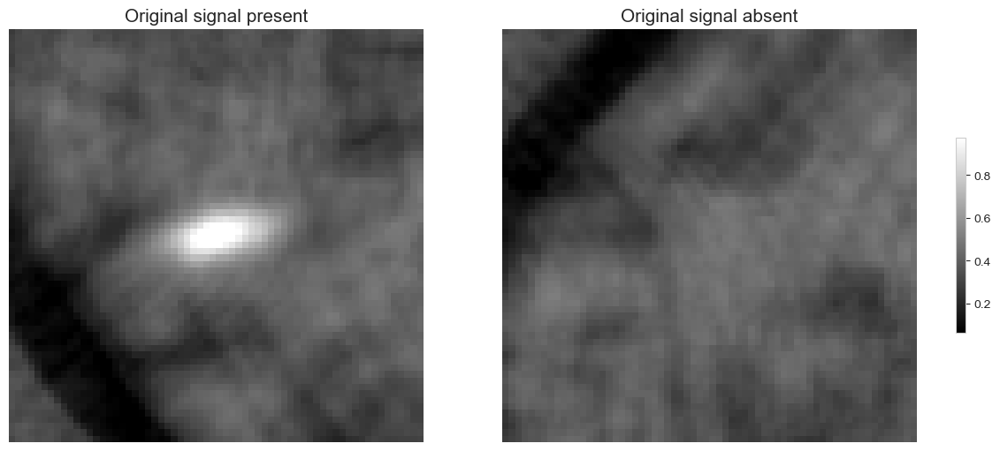

In [106]:
import matplotlib.pyplot as plt
import numpy as np

# Stack images to compute global vmin and vmax
all_imgs = np.array([signal_patches[5], nonsignal_patches[5]])
vmin = np.min(all_imgs)
vmax = np.max(all_imgs)

# Use constrained_layout to handle spacing automatically
fig, axes = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

titles = ['Original signal present', 'Original signal absent']
images = [signal_patches[22], nonsignal_patches[22]]

for ax, img, title in zip(axes, images, titles):
    im = ax.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
    ax.set_title(title, fontsize = 15)
    ax.axis('off')

# Add a single shared colorbar
fig.colorbar(im, ax=axes, fraction=0.01, pad=0.04)

plt.show()

In [24]:
import numpy as np
from utils_exp import (
    load_kspace_masks, get_lesion_kernel, generate_single_patch_pair
)
from tqdm import tqdm
from pathlib import Path

# Load masks (only once)
load_kspace_masks()

# =============================================
# 1. Configuration for Experiments
# =============================================
experiments = {
    'exp1': {'amplitude': 0.05, 'noise_levels': [1e-3, 4e-4, 1e-4], 'acceleration': [2, 4]},
    'exp2': {'amplitude': 0.2, 'noise_levels': [1e-3, 4e-4, 1e-4], 'acceleration': [2, 4]},

}

# =============================================
# 2. Load MRI Data
# =============================================
MRI_imgs = np.load("C:/Users/garci/FinalReportPark/Data/MRI_imgs/HCP_selected_ones2.npy")
MRI_seg = np.load("C:/Users/garci/FinalReportPark/Data/MRI_seg/HCP_selected_ones2_wmparc.npy")
output_dir = Path("C:/Users/garci/FinalReportPark/Ready_to_explore")
output_dir.mkdir(exist_ok=True)

# =============================================
# 3. Patch Generation and Saving Function
# =============================================
def generate_and_save_patches(amplitude, noise_levels, accelerations, max_images=6):
    for noise in noise_levels:
        for accel in accelerations:
            print(f"\nGenerating patches - intensity: {amplitude}, Noise: {noise}, Acceleration: {accel}x")

            kernel = get_lesion_kernel(rot=30, intensity = amplitude)

            signal_patches = []
            nonsignal_patches = []
            lesion_centers = []
            reference_patches = []
            original_imgs = []
            recon_arrays = []
            orig_recons = []

            for i in tqdm(range(max_images), desc="Generating patch pairs"):
                try:
                    sig, nonsig, info, reference, original_img, recon_array, orig_recon = generate_single_patch_pair(
                        MRI_imgs, MRI_seg, i=i, kernel=kernel,
                        noise=noise, aceleration=accel
                    )
                    if sig is not None:
                        signal_patches.append(sig)
                        nonsignal_patches.append(nonsig)
                        lesion_centers.append(info)
                        reference_patches.append(reference)
                        original_imgs.append(original_img)
                        recon_arrays.append(recon_array)
                        orig_recons.append(orig_recon)

                except ValueError as e:
                    print(f"Skipped index {i}: {e}")
                    continue

            print(f"Generated {len(signal_patches)} patch pairs.")

            patch_data = {
                'signal_patches': np.array(signal_patches),
                'nonsignal_patches': np.array(nonsignal_patches),
                'lesion_centers': np.array(lesion_centers),
                'reference_patches': np.array(reference_patches),
                'original_imgs': np.array(original_imgs),
                'recon_arrays': np.array(recon_arrays),
                'orig_recons': np.array(orig_recons)
            }

            filename = f"patches_amp_{amplitude}_noise_{noise}_accel_{accel}.npy"
            np.save(output_dir / filename, patch_data, allow_pickle=True)
            print(f"Saved {filename}")

# =============================================
# 4. Run All Experiments
# =============================================
for exp_name, config in experiments.items():
    print(f"\nStarting experiment: {exp_name}")
    generate_and_save_patches(
        amplitude=config['amplitude'],
        noise_levels=config['noise_levels'],
        accelerations=config['acceleration']
    )

print("\nAll patches generated and saved in separate .npy files!")
print("You can load any file with:")
print("img = np.load('patches_amp_0.05_noise_0.004_accel_4.npy', allow_pickle=True).item()")
print("Then access: signal_patches = img['signal_patches'], etc.")


Starting experiment: exp1

Generating patches - intensity: 0.05, Noise: 0.001, Acceleration: 2x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 88.95it/s]


Generated 6 patch pairs.
Saved patches_amp_0.05_noise_0.001_accel_2.npy

Generating patches - intensity: 0.05, Noise: 0.001, Acceleration: 4x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 93.12it/s]


Generated 6 patch pairs.
Saved patches_amp_0.05_noise_0.001_accel_4.npy

Generating patches - intensity: 0.05, Noise: 0.0004, Acceleration: 2x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 86.92it/s]


Generated 6 patch pairs.
Saved patches_amp_0.05_noise_0.0004_accel_2.npy

Generating patches - intensity: 0.05, Noise: 0.0004, Acceleration: 4x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 86.49it/s]


Generated 6 patch pairs.
Saved patches_amp_0.05_noise_0.0004_accel_4.npy

Generating patches - intensity: 0.05, Noise: 0.0001, Acceleration: 2x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 85.98it/s]


Generated 6 patch pairs.
Saved patches_amp_0.05_noise_0.0001_accel_2.npy

Generating patches - intensity: 0.05, Noise: 0.0001, Acceleration: 4x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 93.11it/s]


Generated 6 patch pairs.
Saved patches_amp_0.05_noise_0.0001_accel_4.npy

Starting experiment: exp2

Generating patches - intensity: 0.2, Noise: 0.001, Acceleration: 2x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 90.19it/s]


Generated 6 patch pairs.
Saved patches_amp_0.2_noise_0.001_accel_2.npy

Generating patches - intensity: 0.2, Noise: 0.001, Acceleration: 4x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 86.54it/s]


Generated 6 patch pairs.
Saved patches_amp_0.2_noise_0.001_accel_4.npy

Generating patches - intensity: 0.2, Noise: 0.0004, Acceleration: 2x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 89.64it/s]


Generated 6 patch pairs.
Saved patches_amp_0.2_noise_0.0004_accel_2.npy

Generating patches - intensity: 0.2, Noise: 0.0004, Acceleration: 4x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 94.10it/s]


Generated 6 patch pairs.
Saved patches_amp_0.2_noise_0.0004_accel_4.npy

Generating patches - intensity: 0.2, Noise: 0.0001, Acceleration: 2x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 94.12it/s]


Generated 6 patch pairs.
Saved patches_amp_0.2_noise_0.0001_accel_2.npy

Generating patches - intensity: 0.2, Noise: 0.0001, Acceleration: 4x


Generating patch pairs: 100%|██████████| 6/6 [00:00<00:00, 91.30it/s]

Generated 6 patch pairs.
Saved patches_amp_0.2_noise_0.0001_accel_4.npy

All patches generated and saved in separate .npy files!
You can load any file with:
img = np.load('patches_amp_0.05_noise_0.004_accel_4.npy', allow_pickle=True).item()
Then access: signal_patches = img['signal_patches'], etc.



=== Showing results for: patches_amp_0.05_noise_0.0001_accel_2.npy ===


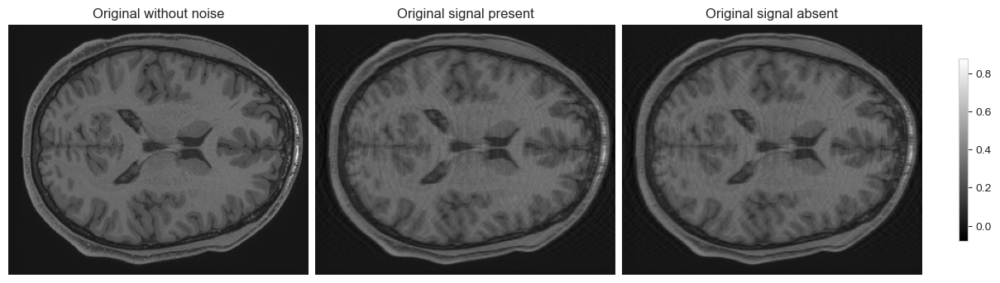


=== Showing results for: patches_amp_0.05_noise_0.0001_accel_4.npy ===


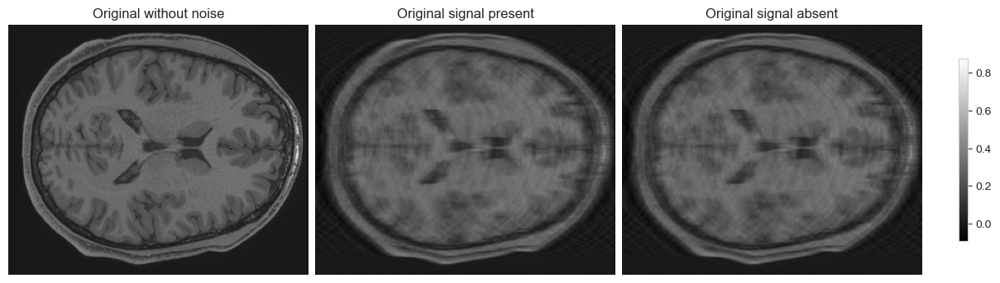


=== Showing results for: patches_amp_0.05_noise_0.0004_accel_2.npy ===


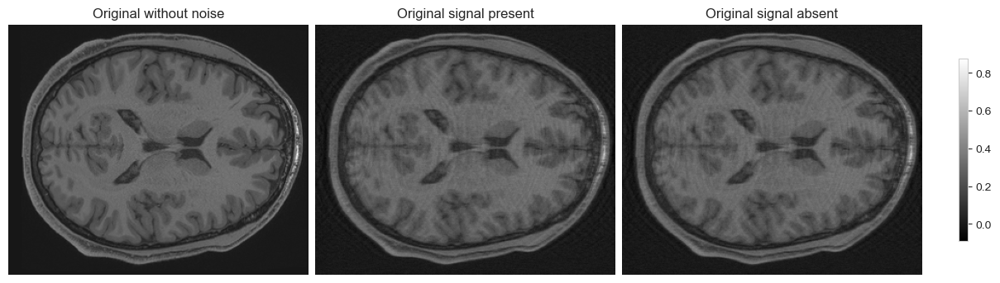


=== Showing results for: patches_amp_0.05_noise_0.0004_accel_4.npy ===


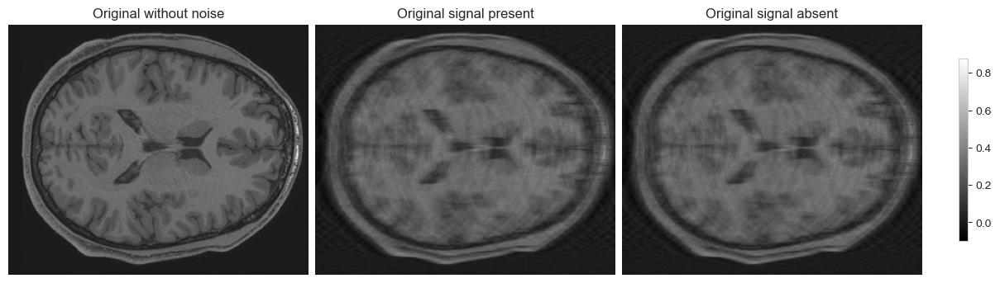


=== Showing results for: patches_amp_0.05_noise_0.001_accel_2.npy ===


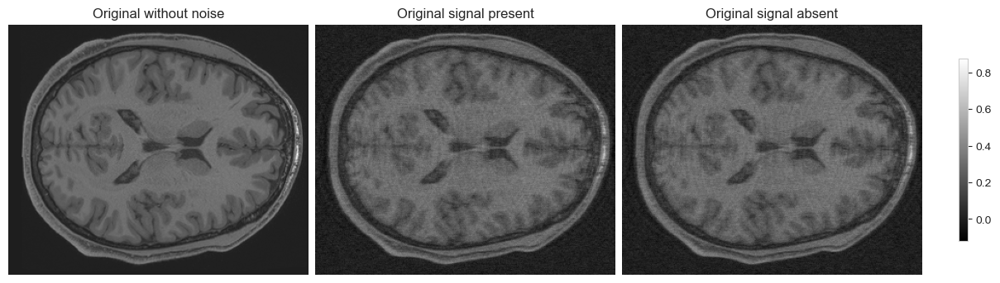


=== Showing results for: patches_amp_0.05_noise_0.001_accel_4.npy ===


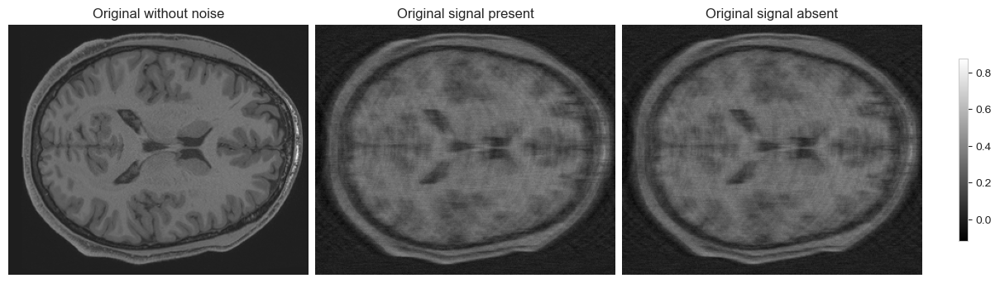


=== Showing results for: patches_amp_0.05_noise_0.004_accel_2.npy ===


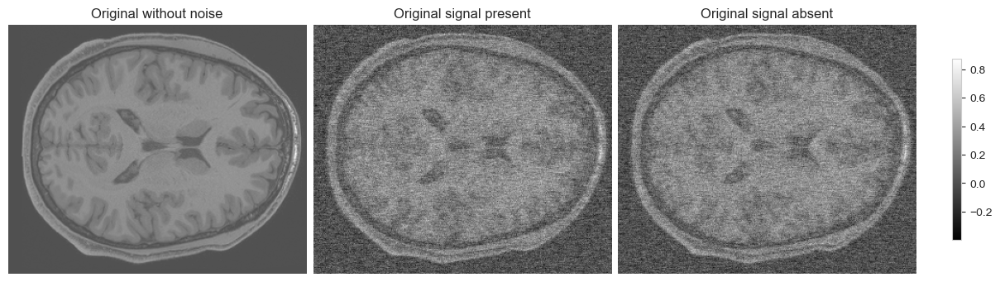


=== Showing results for: patches_amp_0.05_noise_0.004_accel_4.npy ===


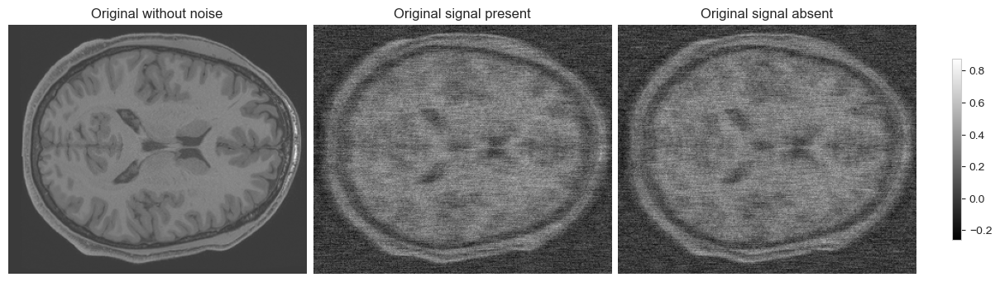


=== Showing results for: patches_amp_0.05_noise_0.008_accel_2.npy ===


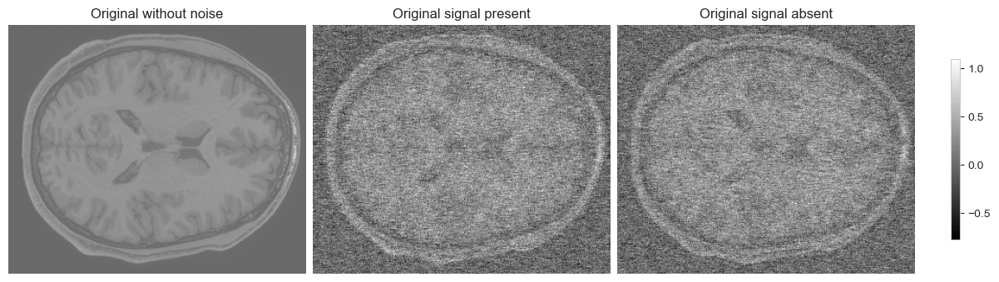


=== Showing results for: patches_amp_0.05_noise_0.008_accel_4.npy ===


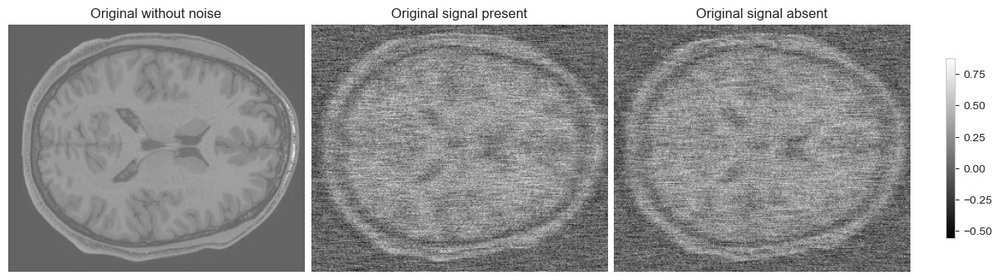


=== Showing results for: patches_amp_0.2_noise_0.0001_accel_2.npy ===


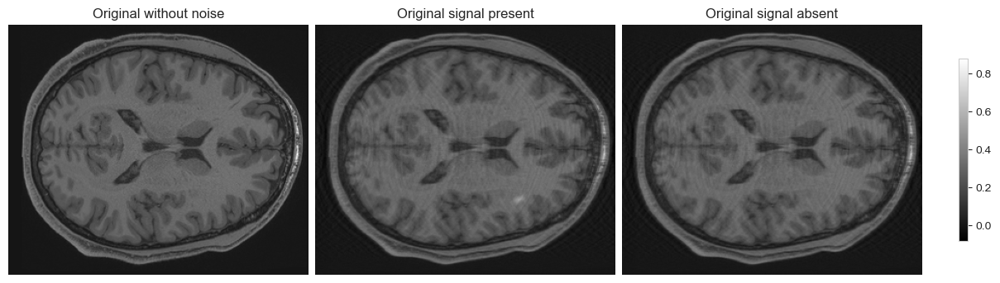


=== Showing results for: patches_amp_0.2_noise_0.0001_accel_4.npy ===


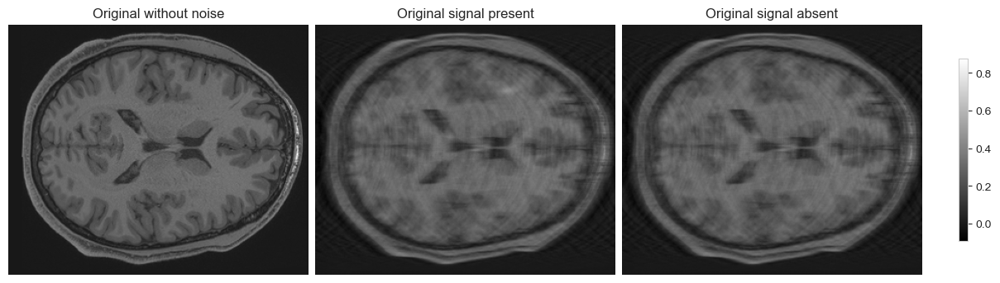


=== Showing results for: patches_amp_0.2_noise_0.0004_accel_2.npy ===


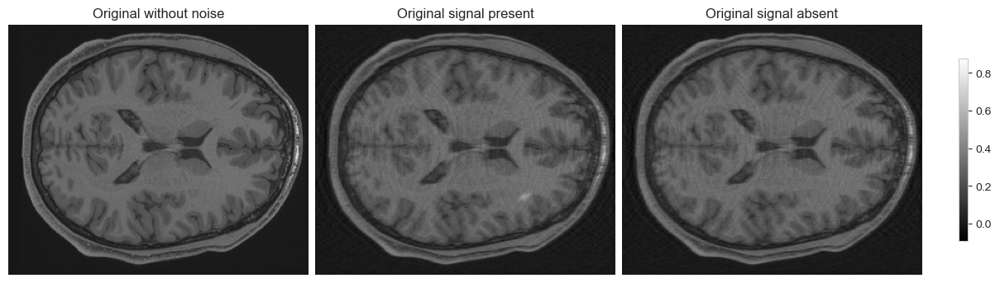


=== Showing results for: patches_amp_0.2_noise_0.0004_accel_4.npy ===


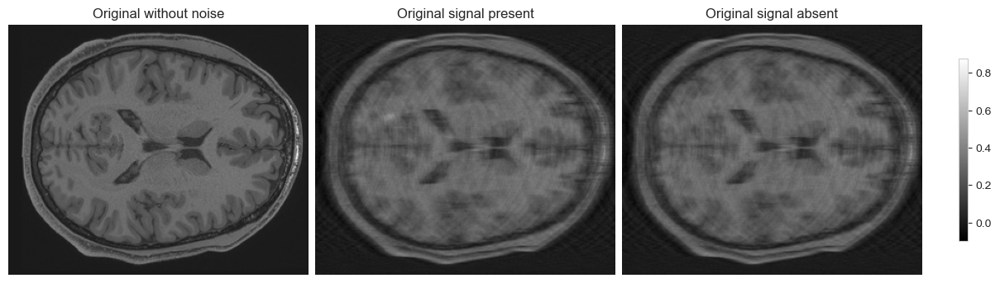


=== Showing results for: patches_amp_0.2_noise_0.001_accel_2.npy ===


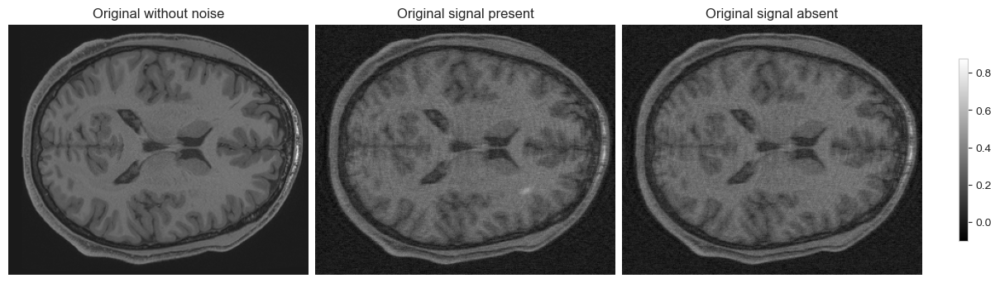


=== Showing results for: patches_amp_0.2_noise_0.001_accel_4.npy ===


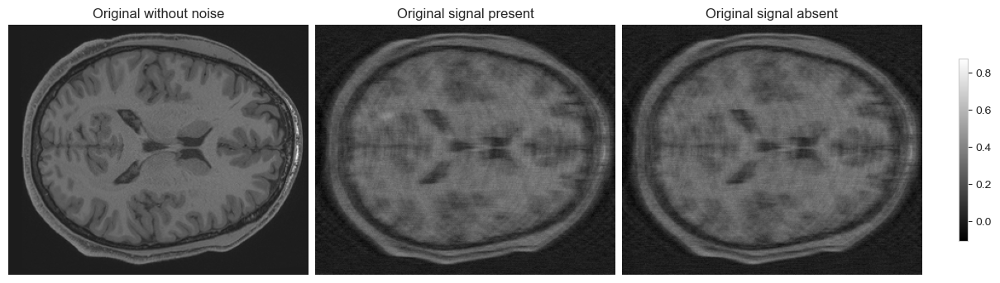


=== Showing results for: patches_amp_0.2_noise_0.004_accel_2.npy ===


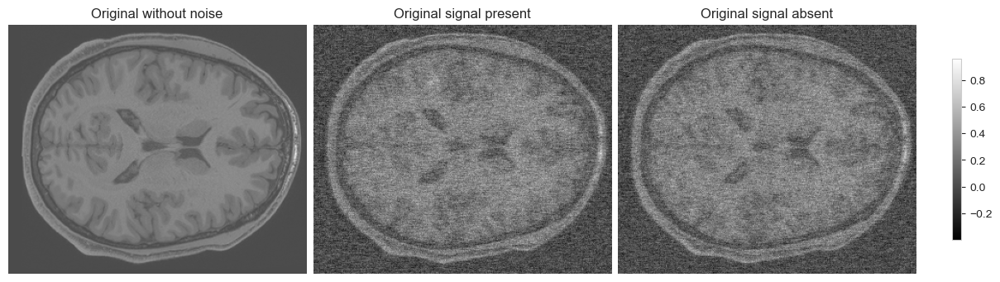


=== Showing results for: patches_amp_0.2_noise_0.004_accel_4.npy ===


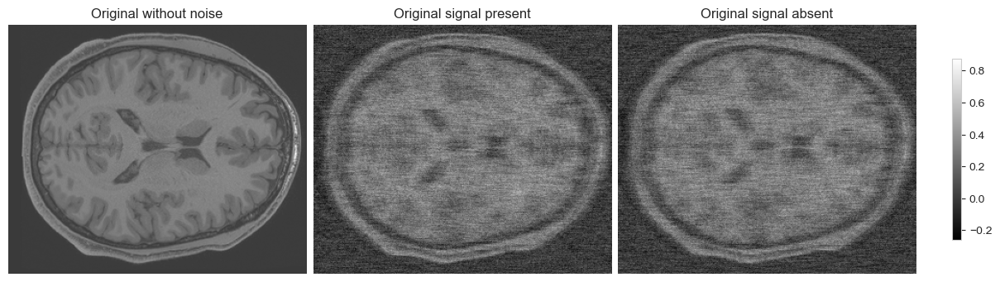


=== Showing results for: patches_amp_0.2_noise_0.008_accel_2.npy ===


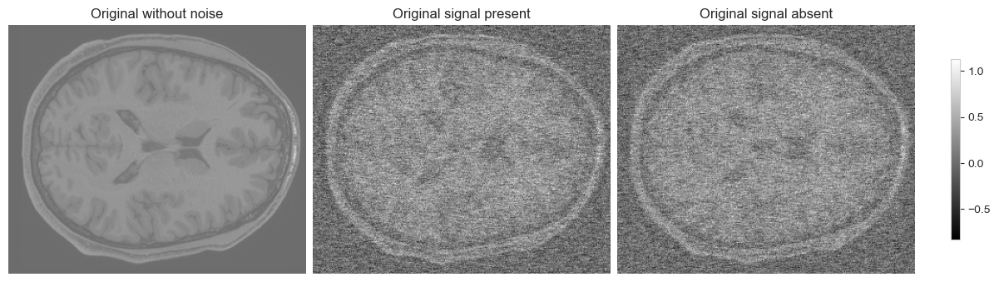


=== Showing results for: patches_amp_0.2_noise_0.008_accel_4.npy ===


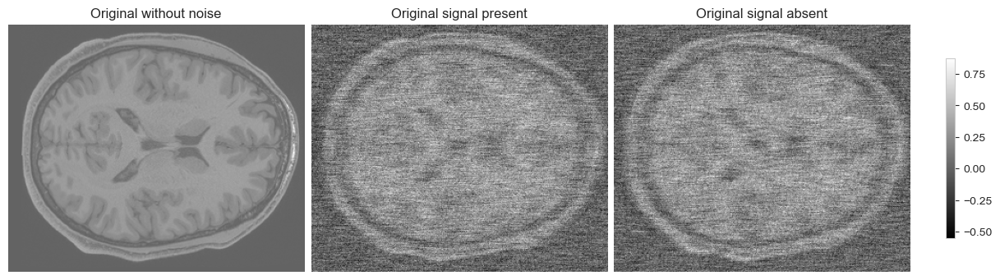

In [25]:
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

# Folder with .npy files
npy_files = list(Path("./Ready_to_explore").glob("*.npy"))

for npy_file in npy_files:
    print(f"\n=== Showing results for: {npy_file.name} ===")

    # Load .npy file containing dictionary
    img = np.load(npy_file, allow_pickle=True).item()

    signal_patches     = img['signal_patches']
    nonsignal_patches  = img['nonsignal_patches']
    reference_patches  = img['reference_patches']
    original_imgs      = img['original_imgs']
    recon_arrays       = img['recon_arrays']
    orig_recons        = img['orig_recons']

    # Sample index (you can loop over several if needed)
    idx = 4

    # Stack images to compute global vmin and vmax
    all_imgs = np.array([original_imgs[idx], recon_arrays[idx], orig_recons[idx]])
    vmin = np.min(all_imgs)
    vmax = np.max(all_imgs)

    # Use constrained_layout to handle spacing automatically
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), constrained_layout=True)

    titles = ['Original without noise', 'Original signal present', 'Original signal absent']
    images = [original_imgs[idx], recon_arrays[idx], orig_recons[idx]]

    for ax, img, title in zip(axes, images, titles):
        im = ax.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
        ax.set_title(title)
        ax.axis('off')

    # Add a single shared colorbar
    fig.colorbar(im, ax=axes, fraction=0.01, pad=0.04)

    plt.show()


=== Showing results for: patches_amp_0.05_noise_0.0001_accel_2.npy ===


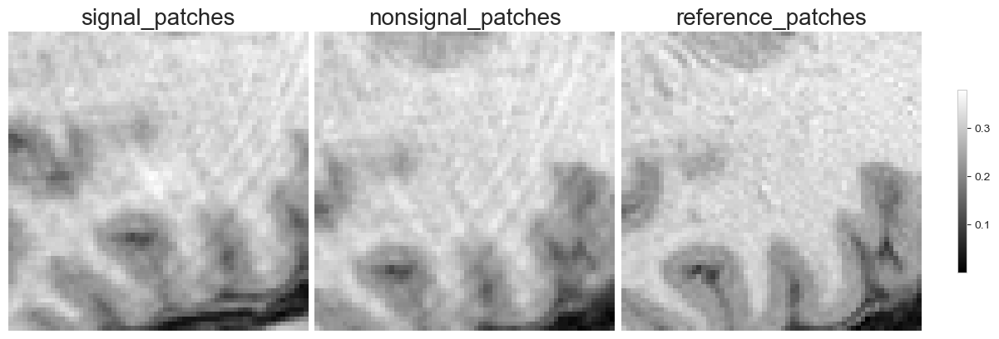


=== Showing results for: patches_amp_0.05_noise_0.0001_accel_4.npy ===


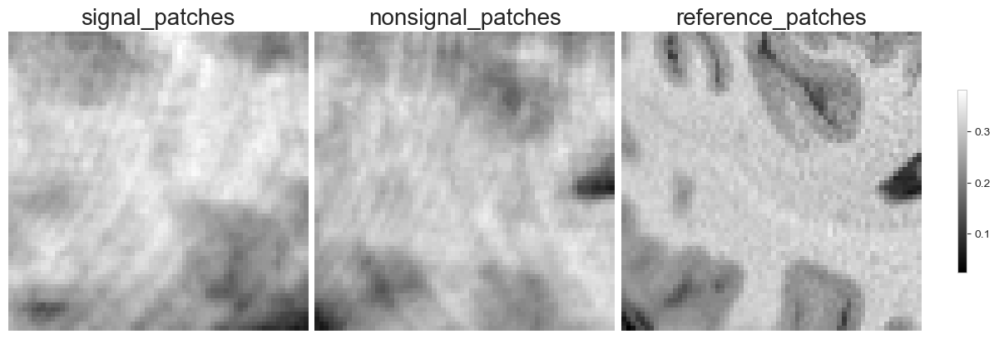


=== Showing results for: patches_amp_0.05_noise_0.0004_accel_2.npy ===


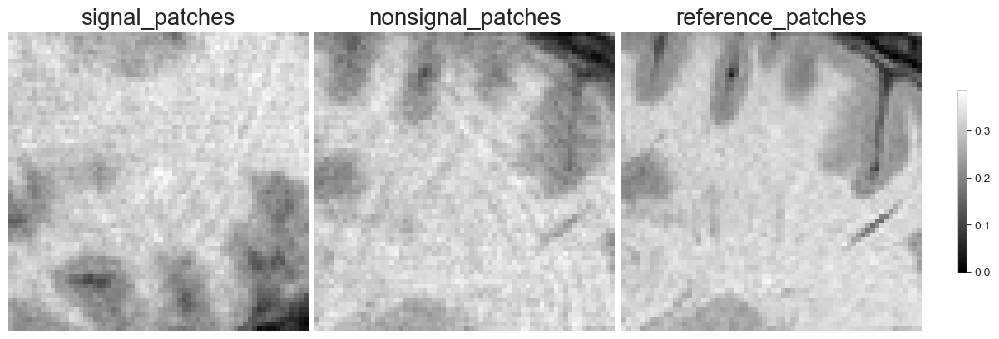


=== Showing results for: patches_amp_0.05_noise_0.0004_accel_4.npy ===


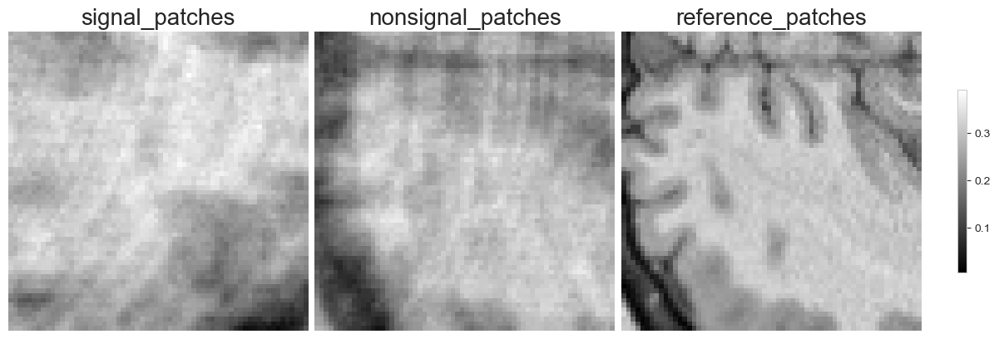


=== Showing results for: patches_amp_0.05_noise_0.001_accel_2.npy ===


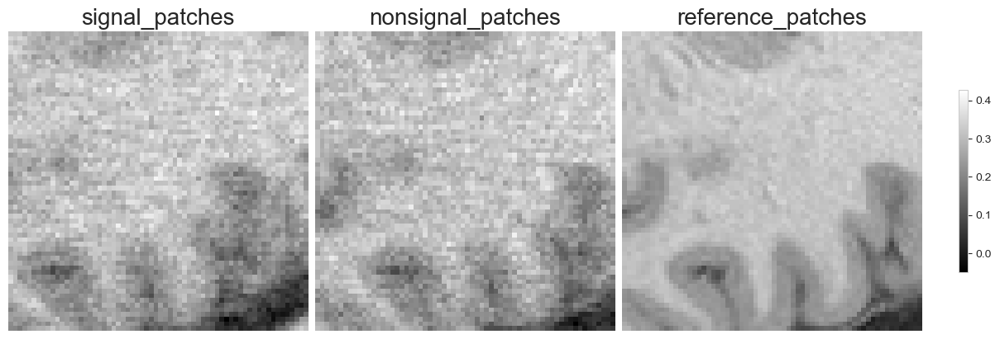


=== Showing results for: patches_amp_0.05_noise_0.001_accel_4.npy ===


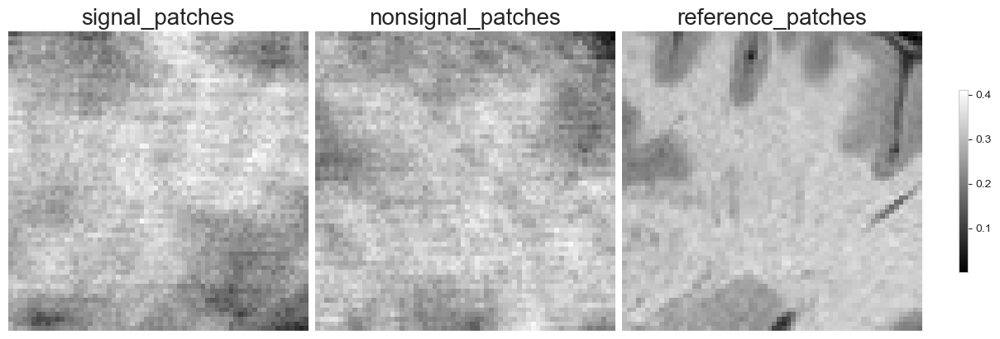


=== Showing results for: patches_amp_0.05_noise_0.004_accel_2.npy ===


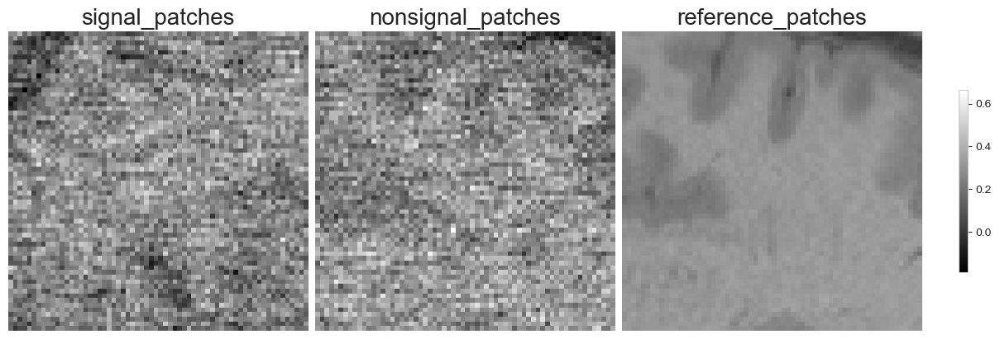


=== Showing results for: patches_amp_0.05_noise_0.004_accel_4.npy ===


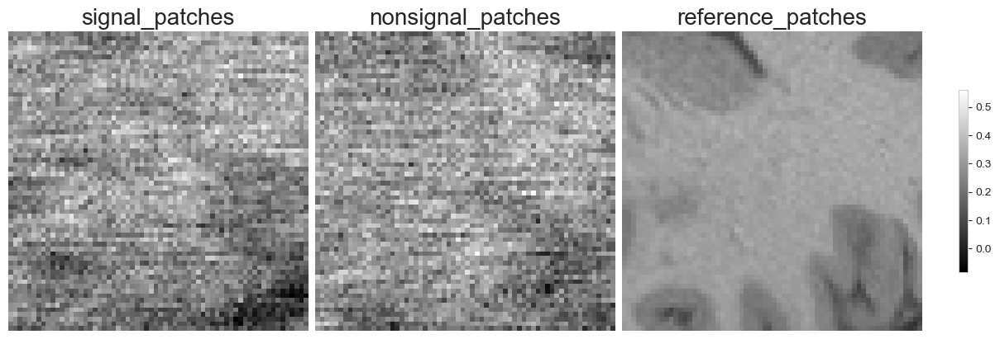


=== Showing results for: patches_amp_0.05_noise_0.008_accel_2.npy ===


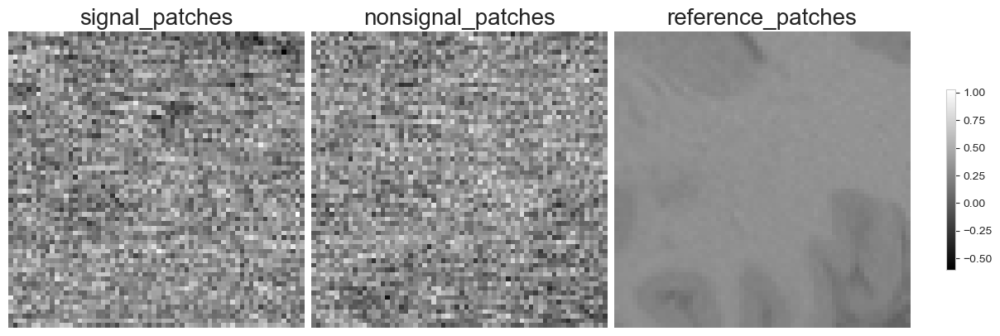


=== Showing results for: patches_amp_0.05_noise_0.008_accel_4.npy ===


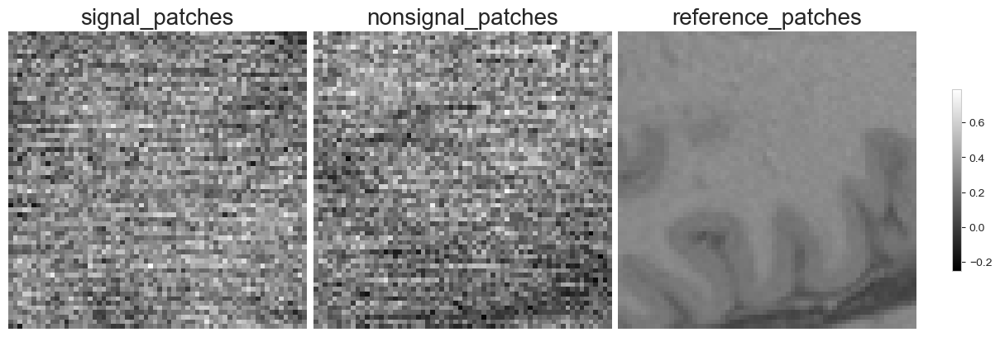


=== Showing results for: patches_amp_0.2_noise_0.0001_accel_2.npy ===


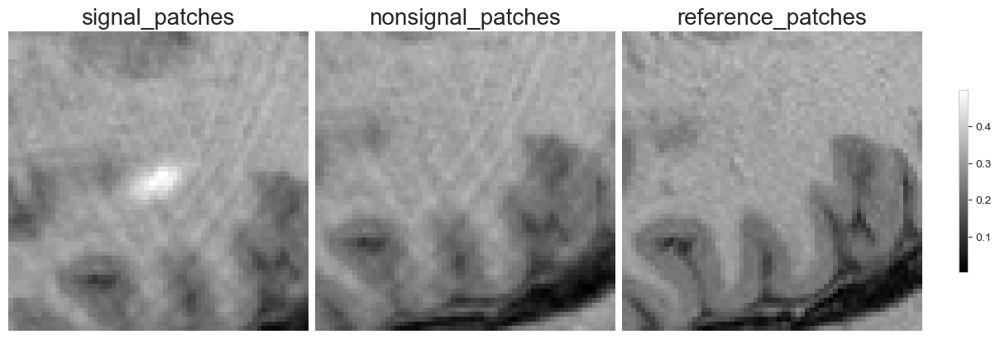


=== Showing results for: patches_amp_0.2_noise_0.0001_accel_4.npy ===


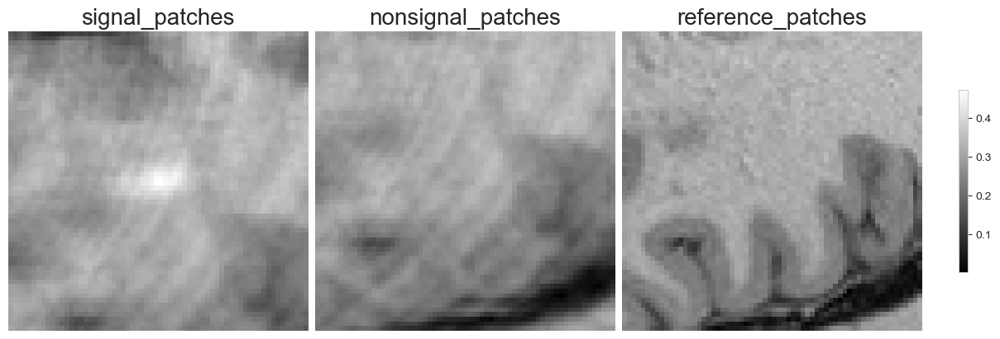


=== Showing results for: patches_amp_0.2_noise_0.0004_accel_2.npy ===


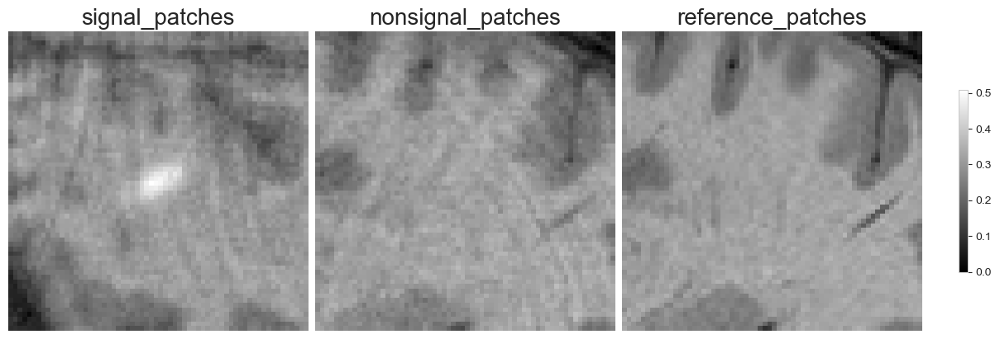


=== Showing results for: patches_amp_0.2_noise_0.0004_accel_4.npy ===


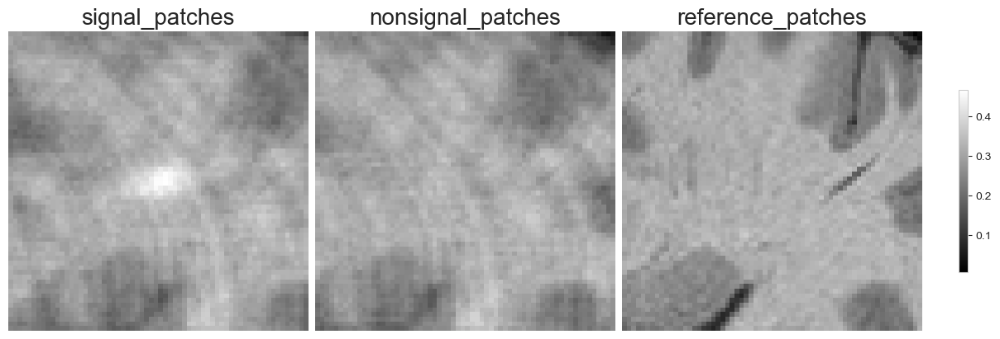


=== Showing results for: patches_amp_0.2_noise_0.001_accel_2.npy ===


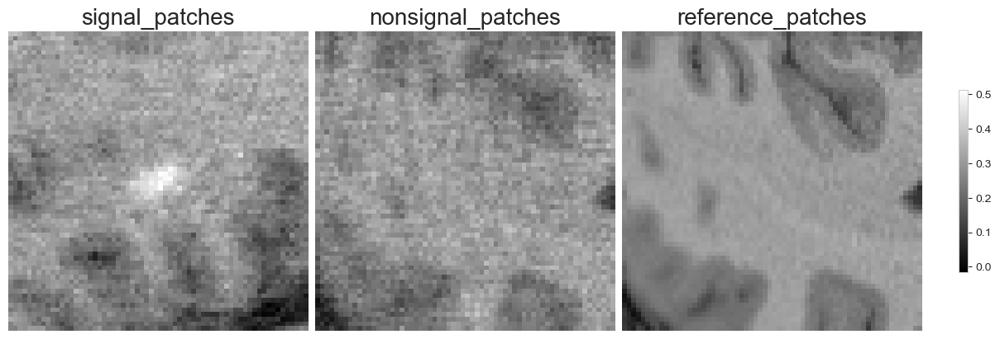


=== Showing results for: patches_amp_0.2_noise_0.001_accel_4.npy ===


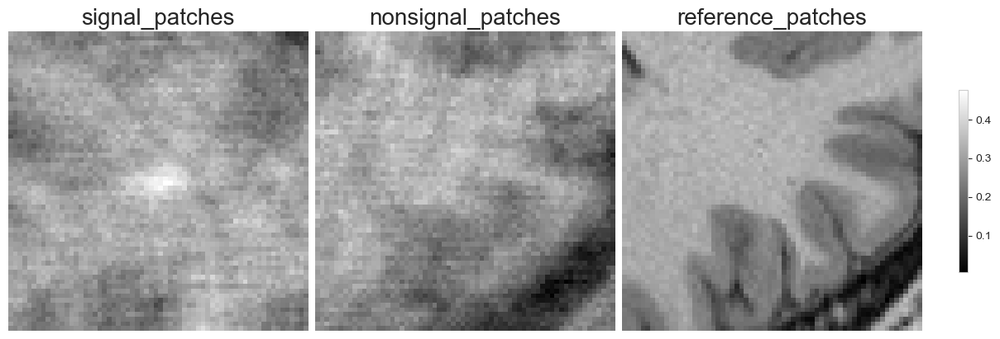


=== Showing results for: patches_amp_0.2_noise_0.004_accel_2.npy ===


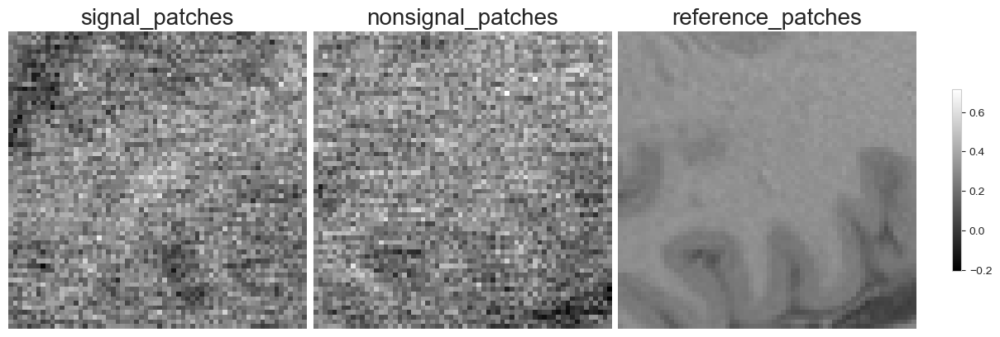


=== Showing results for: patches_amp_0.2_noise_0.004_accel_4.npy ===


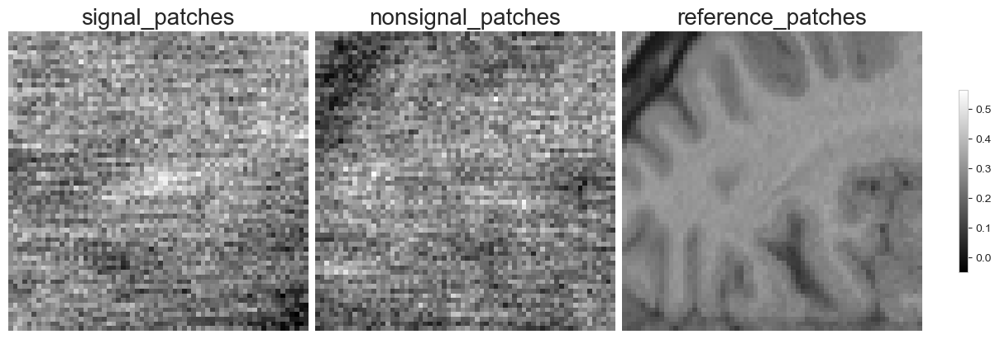


=== Showing results for: patches_amp_0.2_noise_0.008_accel_2.npy ===


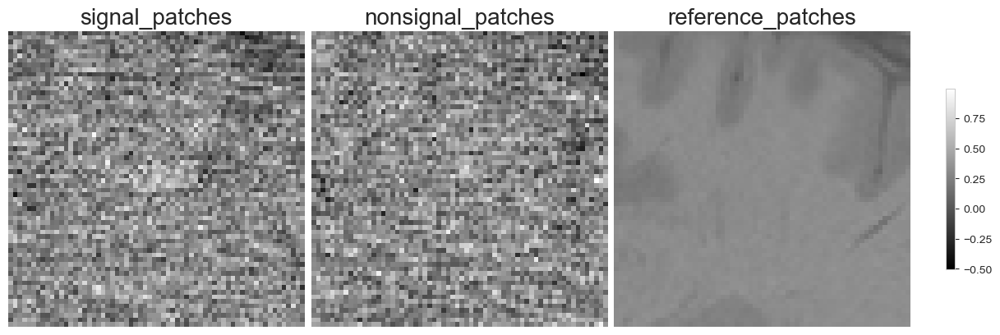


=== Showing results for: patches_amp_0.2_noise_0.008_accel_4.npy ===


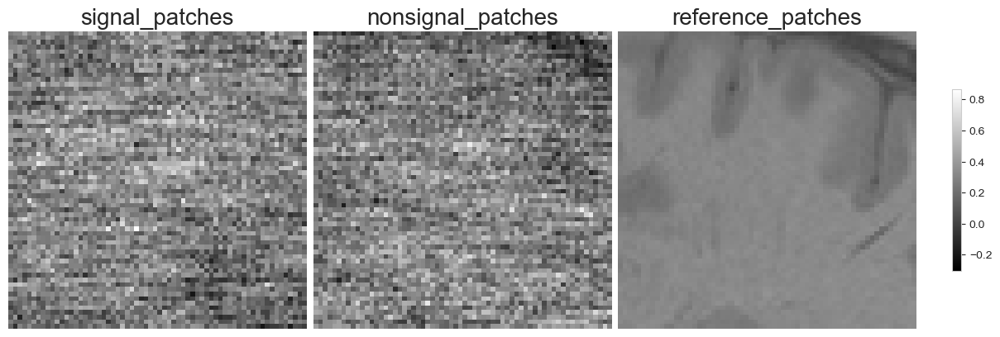

In [113]:
# Folder with .npy files
npy_files = list(Path("./Ready_to_train").glob("*.npy"))

for npy_file in npy_files:
    print(f"\n=== Showing results for: {npy_file.name} ===")

    # Load .npy file containing dictionary
    img = np.load(npy_file, allow_pickle=True).item()

    signal_patches     = img['signal_patches']
    nonsignal_patches  = img['nonsignal_patches']
    reference_patches  = img['reference_patches']
    # original_imgs      = img['original_imgs']
    # recon_arrays       = img['recon_arrays']
    # orig_recons        = img['orig_recons']

    # Sample index (you can loop over several if needed)
    idx = 3

    # Stack images to compute global vmin and vmax
    all_imgs = np.array([signal_patches[idx], nonsignal_patches[idx], reference_patches[idx]])
    vmin = np.min(all_imgs)
    vmax = np.max(all_imgs)

    # Use constrained_layout to handle spacing automatically
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), constrained_layout=True)

    titles = ['signal_patches', 'nonsignal_patches', 'reference_patches']
    images = [signal_patches[idx], nonsignal_patches[idx], reference_patches[idx]]

    for ax, img, title in zip(axes, images, titles):
        im = ax.imshow(img, cmap='gray', vmin=vmin, vmax=vmax)
        ax.set_title(title, fontsize = 20)
        ax.axis('off')

    # Add a single shared colorbar
    fig.colorbar(im, ax=axes, fraction=0.01, pad=0.04)

    plt.show()

In [57]:
# Stack patches into a single array
X_signal = np.stack(signal_patches)            # shape: (Nsamples, 64, 64)
X_nonsignal = np.stack(nonsignal_patches)      # same shape

# Create corresponding labels
y_signal = np.ones(len(X_signal), dtype=int)       # Label = 1 for signal-present
y_nonsignal = np.zeros(len(X_nonsignal), dtype=int) # Label = 0 for signal-absent

# Combine and shuffle
X = np.concatenate([X_signal, X_nonsignal], axis=0)
y = np.concatenate([y_signal, y_nonsignal], axis=0)

# Shuffle the dataset
indices = np.random.permutation(len(X))
X = X[indices]
y = y[indices]

In [58]:
#sperate the data into train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=10, stratify=y, random_state=13)

print(f'Training data: {X_train.shape}, {y_train.shape}')
print(f'Testing data: {X_test.shape}, {y_test.shape}')


Training data: (21990, 64, 64), (21990,)
Testing data: (10, 64, 64), (10,)


In [59]:
#Filter Design
'''
Since we are working with elipitcal lesions, we use the gabor channel. The gabor channel is 
defined by the following parameters:
x' = xcos(theta) + ysin(theta) 
y' = -xsin(theta) + ycos(theta) 
theta is the rotation angle
sigmax, sigmay the eliptical size (in our case: 2 and 4) 
f = freqeuncy

gabor channel acts as a basis we designed since we already know what we are looking for.
each gabor channel tells us how much of this lesion like patter is in the image


'''
def create_gabor_channel(size = 64, sigma_x = 4, sigma_y = 2, theta = 30, freq = 0.15): 
    x = np.linspace(-size//2, size//2, size) 
    y = np.linspace(-size//2, size//2, size) 
    X,Y = np.meshgrid(x,y) 
    #Creates grid that matches the 64 x 64 patches
    theta_rad = np.deg2rad(theta) 
    X_rot = X * np.cos(theta_rad) + Y * np.sin(theta_rad) 
    Y_rot = -X * np.sin(theta_rad) + Y * np.cos(theta_rad) 

    guass = np.exp(-0.5 * (X_rot**2 / sigma_x**2 + Y_rot**2 / sigma_y**2))
    carrier = np.cos(2*np.pi*freq*X_rot) 
    
    gabor = guass*carrier
    #the gabor equation
    return gabor

In [60]:
'''
Creating multiple channels by sweeping through different parameters to create robust detectability

'''


sigmas = [(4,2)] 
thetas = [0, 30, 60, 90] 
freqs = [0.1, 0.15]

channels = [] 

for sigma_x, sigma_y in sigmas: 
    for theta in thetas: 
        for freq in freqs: 
            gabor = create_gabor_channel(size = 64, sigma_x = sigma_x, sigma_y = sigma_y, theta = theta, freq = freq) 
            channels.append(gabor) 

channels = np.stack(channels) 
print(f'Created {channels.shape[0]} Gabor channels of size {channels.shape[1:]} each.') 

Created 8 Gabor channels of size (64, 64) each.


In [61]:
channels.shape

(8, 64, 64)

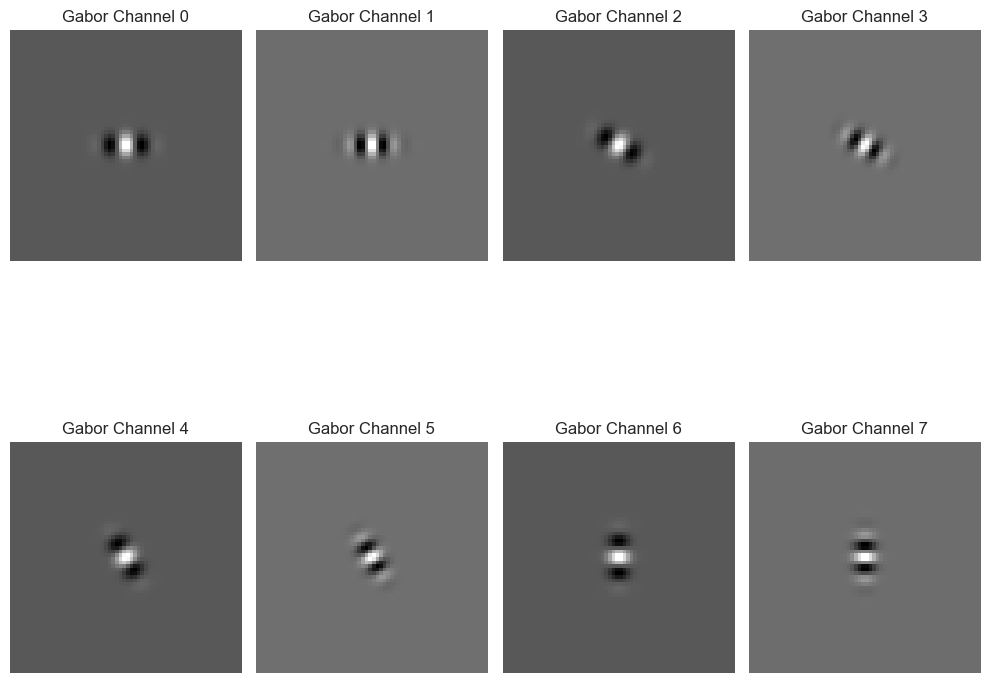

In [62]:
plt.figure(figsize = (10,10))
for i in range(1,len(channels)+1):
    plt.subplot(2,4,i)
    plt.imshow(channels[i-1], cmap = 'gray')
    plt.title(f'Gabor Channel {i-1}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [63]:
U = channels.reshape(channels.shape[0], -1).T 

X_train_flat = X_train.reshape(X_train.shape[0], -1) 
X_test_flat = X_test.reshape(X_test.shape[0], -1)

In [64]:
X_train_present = X_train_flat[y_train == 1]
X_train_absent = X_train_flat[y_train == 0] 

In [65]:
mean_g_present = np.mean(X_train_present, axis = 0) 
mean_g_absent = np.mean(X_train_absent, axis = 0) 
delta_mean_g = mean_g_present - mean_g_absent

In [66]:
K_g_present = np.cov(X_train_present, rowvar = False) 
K_g_absent = np.cov(X_train_absent, rowvar = False) 
K_g = 0.5*(K_g_present + K_g_absent) 

In [67]:
temp = U.T@delta_mean_g #this is expectation of v
K_v = U.T@K_g@U

SNR2_stat = temp.T@np.linalg.pinv(K_v)@temp
print(f'CHO SNR^2 = {SNR2_stat:.4f}')

CHO SNR^2 = 1.2364


In [68]:
v_train = X_train_flat @ U 
v_test = X_test_flat @ U 

'''
Did g@U instead of Uatg becuase then each row of v contains the channel outputs for one patch. but mathemtically the same

each row is the different patches. each column are the different channel outputs
'''

'\nDid g@U instead of Uatg becuase then each row of v contains the channel outputs for one patch. but mathemtically the same\n\neach row is the different patches. each column are the different channel outputs\n'

In [69]:
v_train_present = v_train[y_train == 1] 
v_train_absent = v_train[y_train == 0] 

mean_present = np.mean(v_train_present, axis = 0) 
mean_absent = np.mean(v_train_absent, axis = 0) 

K1 = np.cov(v_train_absent, rowvar = False) #H0
K2 = np.cov(v_train_present, rowvar = False) #H1 

K_avg = 0.5*(K1+K2) 

delta_mean = mean_present - mean_absent

W_hot = np.linalg.pinv(K_avg) @ delta_mean

In [70]:
t_train = v_train @ W_hot #scores for each patch on whether signal present or absent
t_test = v_test @ W_hot

In [72]:
t_train_present = t_train[y_train == 1] 
t_train_absent = t_train[y_train == 0] 

mu1 = np.mean(t_train_present) 
mu0 = np.mean(t_train_absent) 

var1 = np.var(t_train_present, ddof = 1) 
var0 = np.var(t_train_absent, ddof = 1) 

sigma2 = 0.5 * (var1 + var0) 
SNR2 = (mu1 - mu0)**2 / sigma2

print(f'SNR^2 (training set) = {SNR2:.4f}')

SNR^2 (training set) = 1.2364


In [74]:
t_c = 0.5 * (mu1 + mu0) 

In [75]:
y_pred_test = (t_test > t_c).astype(int) 

In [76]:
FPF, TPF, thresholds = roc_curve(y_test, t_test) 
AUC = roc_auc_score(y_test, t_test) 

print(f'AUC: {AUC:.4f}')

AUC: 0.7600


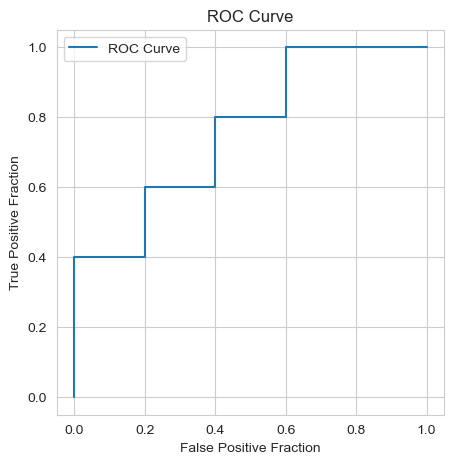

In [78]:
plt.figure(figsize = (5,5))
plt.plot(FPF, TPF, label = 'ROC Curve') 
plt.xlabel('False Positive Fraction') 
plt.ylabel('True Positive Fraction') 
plt.title('ROC Curve') 
plt.legend() 
plt.grid(True) 
plt.show() 

In [ ]:
import pandas as pd


amplitudes = [0.2, 0.05]
masks = [2, 4]
noise_stds = [1e-3, 4e-3, 1e-2]


results = []


for amp in amplitudes:
    for mask in masks:
        for noise_std in noise_stds:
            print(f"\nRunning: Amplitude={amp}, Mask={mask}, Noise STD={noise_std}")
            
            # Reset storage lists
            signal_patches = []
            nonsignal_patches = []
            lesion_centers = []

            # Generate patches 
            for i in range(MRI_imgs.shape[0]):
                img = MRI_imgs[i, :, :].copy()
                seg = MRI_seg[i, :, :].copy()

                valid_mask = ppm.mri_valid_regions(seg)
                try:
                    lesion_spots = ppm.find_spots(valid_mask, demo_kernel, unpad=20)
                except:
                    continue
                if len(lesion_spots) < 2:
                    continue

                lesion_loc = lesion_spots[0]
                alt_loc = lesion_spots[1]
                original_img = img.copy()

                # Add lesion
                ppm.add_lesion(img, demo_kernel * amp, lesion_loc)

                # Forward model + noise + mask + inverse
                img_k = ppm.forward_k(img)
                img_k.real = ppm.add_noise_k(img_k.real, noise_std * img_k.real.max())
                img_k.imag = ppm.add_noise_k(img_k.imag, noise_std * img_k.imag.max())
                img_k = ppm.apply_mask_k(img_k, mask)
                recon_array = ppm.inverse_k(img_k).real

                # Extract signal-present patch
                y, x = lesion_loc
                signal_patch = recon_array[y-63:y+1, x-63:x+1]

                # Signal-absent patch
                orig_k = ppm.forward_k(original_img)
                orig_k.real = ppm.add_noise_k(orig_k.real, noise_std * orig_k.real.max())
                orig_k.imag = ppm.add_noise_k(orig_k.imag, noise_std * orig_k.imag.max())
                orig_k = ppm.apply_mask_k(orig_k, mask)
                orig_recon = ppm.inverse_k(orig_k).real
                y_ns, x_ns = alt_loc
                nonsignal_patch = orig_recon[y_ns-63:y_ns+1, x_ns-63:x_ns+1]

                signal_patches.append(signal_patch)
                nonsignal_patches.append(nonsignal_patch)
                lesion_centers.append((i, y, x))

                if len(signal_patches) >= 11000:
                    break
            
            # Build X/y train/test
            X = np.array(signal_patches + nonsignal_patches)
            y = np.array([1]*len(signal_patches) + [0]*len(nonsignal_patches))
            from sklearn.model_selection import train_test_split
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)

            # Flatten and project with Gabor channels
            X_train_flat = X_train.reshape(X_train.shape[0], -1)
            X_test_flat = X_test.reshape(X_test.shape[0], -1)
            U = channels.reshape(channels.shape[0], -1).T
            v_train = X_train_flat @ U
            v_test = X_test_flat @ U

            # Compute CHO SNR2
            X_train_present = X_train_flat[y_train == 1]
            X_train_absent = X_train_flat[y_train == 0]
            mean_present = np.mean(X_train_present, axis=0)
            mean_absent = np.mean(X_train_absent, axis=0)
            delta_mean_g = mean_present - mean_absent
            K_g_present = np.cov(X_train_present, rowvar=False)
            K_g_absent = np.cov(X_train_absent, rowvar=False)
            K_g = 0.5 * (K_g_present + K_g_absent)
            temp = U.T @ delta_mean_g
            K_v = U.T @ K_g @ U
            SNR2_stat = temp.T @ np.linalg.pinv(K_v) @ temp

            # Compute t-scores and AUC
            delta_mean = np.mean(v_train[y_train == 1], axis=0) - np.mean(v_train[y_train == 0], axis=0)
            K_v = 0.5 * (np.cov(v_train[y_train == 1], rowvar=False) + np.cov(v_train[y_train == 0], rowvar=False))
            W_hot = np.linalg.pinv(K_v) @ delta_mean
            t_test = v_test @ W_hot
            auc = roc_auc_score(y_test, t_test)

            print(f"AUC = {auc:.4f}")
            results.append((amp, mask, noise_std, auc))
